In [90]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
from collections import deque
%matplotlib inline

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

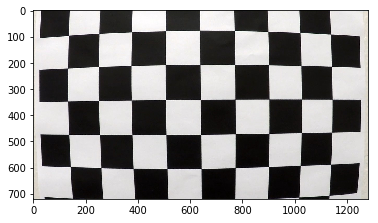

In [7]:
# Camera calibration
img = mpimg.imread('./camera_cal/calibration1.jpg')
plt.imshow(img)

In [8]:
nx, ny = 9, 6

objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

images = glob.glob('./camera_cal/calibration*.jpg')

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

In [9]:
def undistort(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return cv2.undistort(img, mtx, dist, None, mtx)

In [10]:
test_images = glob.glob('./test_images/*.jpg')
for fname in test_images:
    img = mpimg.imread(fname)
    img = undistort(img)
    output = fname.replace('test_images', 'output_images')
    mpimg.imsave(output, img)

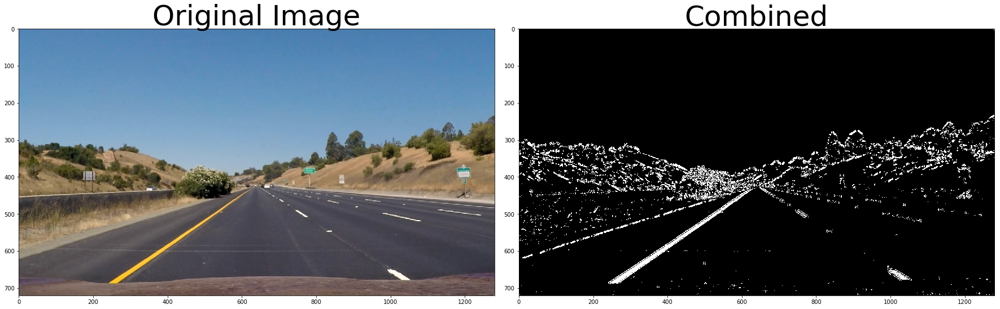

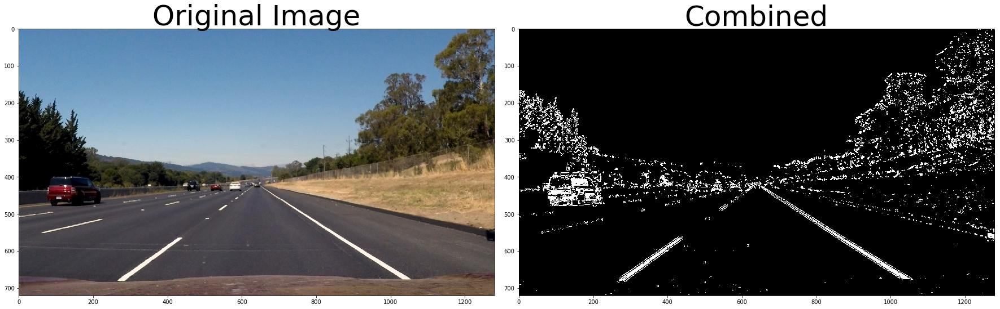

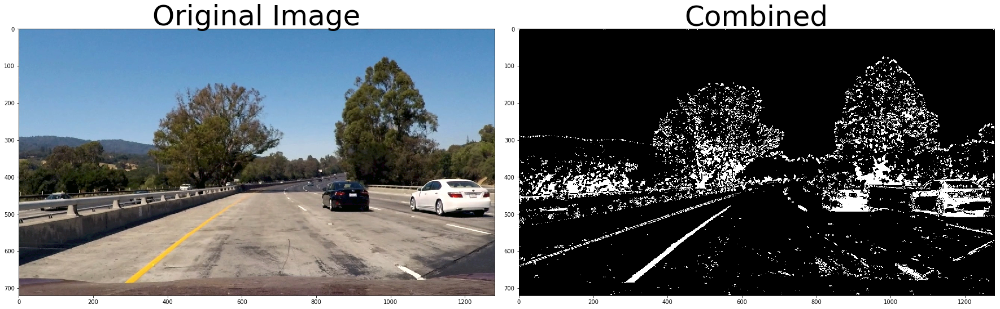

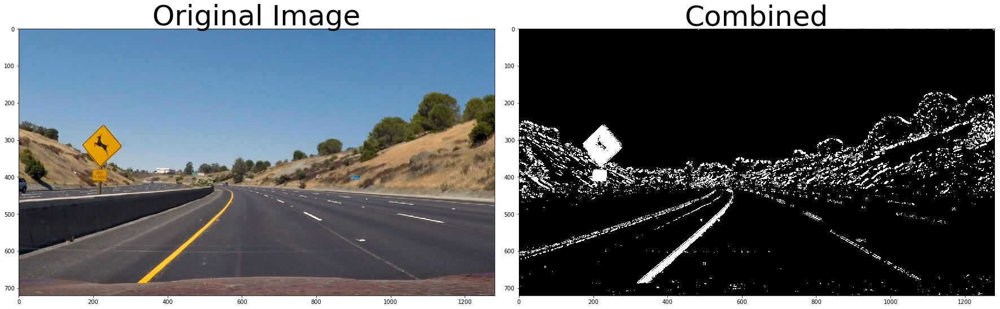

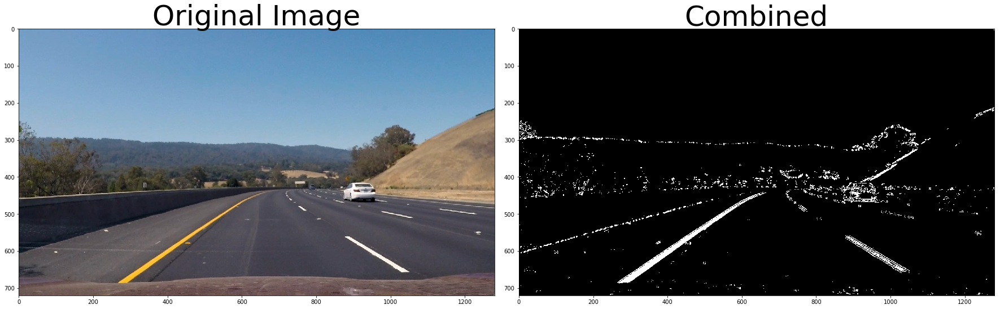

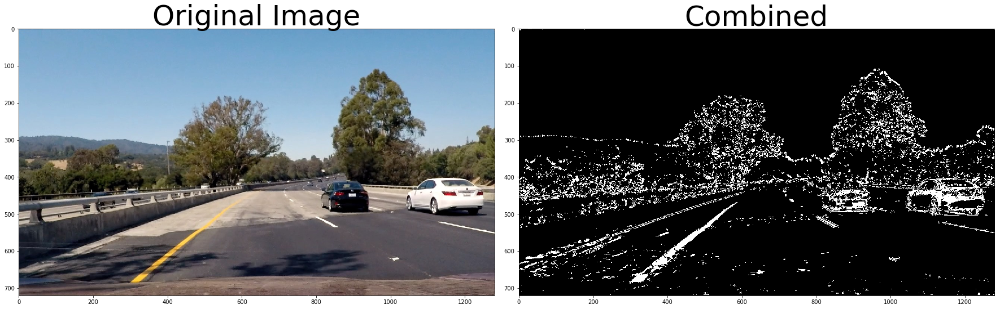

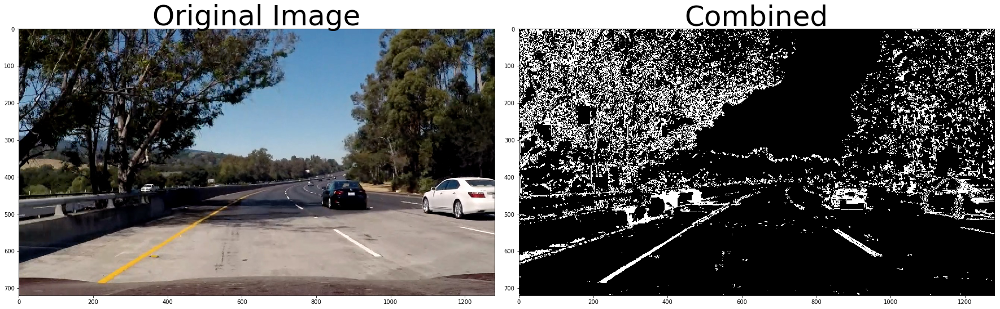

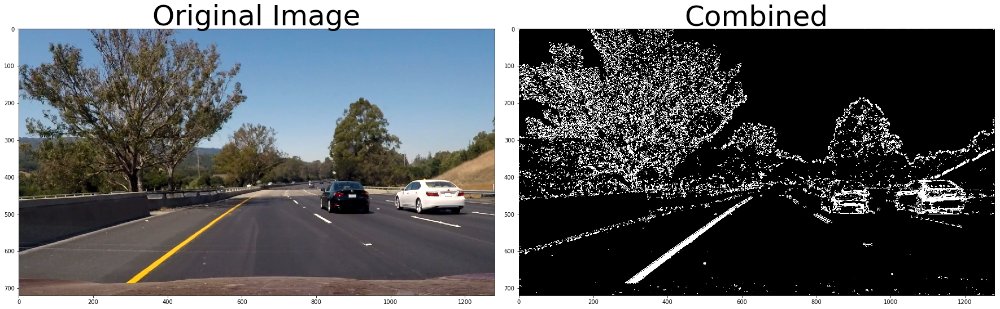

In [11]:
def abs_sobel_thresh(img, orient='x', thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    x, y = 1, 0
    if orient == 'y':
        x, y = 0, 1
    sobel = cv2.Sobel(gray, cv2.CV_64F, x, y)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(magnitude)/255.
    magnitude = (magnitude/scale_factor).astype(np.uint8)
    binary_output = np.zeros_like(magnitude)
    binary_output[(magnitude >= mag_thresh[0]) & (magnitude <= mag_thresh[1])] = 1
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    direction = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(direction)
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    return binary_output

def saturation_threshold(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel >= thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

for fname in test_images:
    image = mpimg.imread(fname)
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', thresh=(20, 100))
    grady = abs_sobel_thresh(image, orient='y', thresh=(20, 100))
    mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
    sat_binary = saturation_threshold(image, thresh=(170, 255))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1) | (sat_binary == 1))] = 1
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(combined, cmap='gray')
    ax2.set_title('Combined', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    output = fname.replace('test_images', 'output_images')
    mpimg.imsave(output, combined)

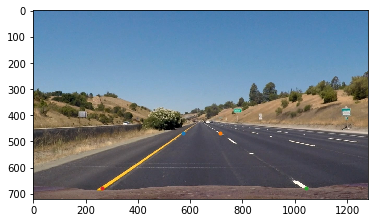

In [12]:
img = mpimg.imread('./test_images/straight_lines1.jpg')

plt.imshow(img)
plt.plot(572, 467, '.')
plt.plot(714, 467, '.')
plt.plot(1042, 677, '.')
plt.plot(264, 677, '.')

In [13]:
def warp(img, unwarp=False):
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([
        [582, 467],
        [714, 467],
        [1120, 719],
        [280, 719]
    ])
    
    dst = np.float32([
        [280, 0],
        [1120, 0],
        [1120, 719],
        [280, 719]
    ])
    
    M = cv2.getPerspectiveTransform(dst, src) if unwarp else cv2.getPerspectiveTransform(src, dst)
    return cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

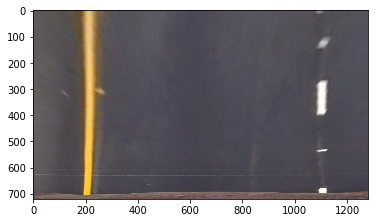

In [14]:
img = mpimg.imread('./test_images/straight_lines1.jpg')
img = warp(img)
plt.imshow(img)

In [15]:
# Putting it all together
def preprocess(img):
    undist = undistort(img)
    gradx = abs_sobel_thresh(undist, orient='x', thresh=(20, 100))
    grady = abs_sobel_thresh(undist, orient='y', thresh=(20, 100))
    mag_binary = mag_thresh(undist, sobel_kernel=9, mag_thresh=(30, 100))
    dir_binary = dir_threshold(undist, sobel_kernel=15, thresh=(0.7, 1.3))
    sat_binary = saturation_threshold(undist, thresh=(170, 255))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1) | (sat_binary == 1))] = 1
    warped = warp(combined)
    return warped

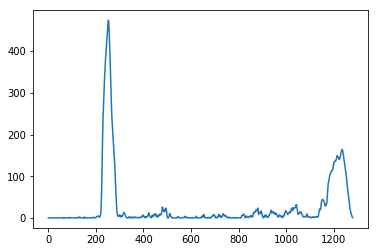

In [87]:
img = cv2.imread('./test_images/test1.jpg')
binary_warped = preprocess(img)
right = binary_warped
histogram = np.sum(right, axis=0)

#plt.imshow(right, cmap='gray')
plt.plot(histogram)

In [132]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
        self.fit_a = deque(maxlen=8)
        self.fit_b = deque(maxlen=8)
        self.fit_c = deque(maxlen=8)
        
    def plot_line(self, image):
        ploty = np.linspace(0, image.shape[0]-1, image.shape[0])
        return self.current_fit[0]*ploty**2 + self.current_fit[1]*ploty + self.current_fit[2]
    
    def fit_line_left(self, image):
        if self.detected:
            self.fit_line(image)
        if not self.detected:
            self.fit_line_histogram_left(image)
        if not self.detected:
            # If we still can't find a value, take the average of the last read.
            self.current_fit = [np.mean(self.fit_a), np.mean(self.fit_b), np.mean(self.fit_c)]
            
    def fit_line_right(self, image):
        if self.detected:
            self.fit_line(image)
        if not self.detected:
            self.fit_line_histogram_right(image)
        if not self.detected:
            # If we still can't find a value, take the average of the last read.
            self.current_fit = [np.mean(self.fit_a), np.mean(self.fit_b), np.mean(self.fit_c)]
    
    def fit_line(self, image):
        nonzero = image.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
        fit_a = np.mean(self.fit_a)
        fit_b = np.mean(self.fit_b)
        fit_c = np.mean(self.fit_c)
        lane_inds = ((nonzerox >= (fit_a*nonzeroy**2 + fit_b*nonzeroy + fit_c - margin)) & (nonzerox <= (fit_a*nonzeroy**2 + fit_b*nonzeroy + fit_c + margin)))  

        if len(lane_inds) == 0:
            self.detected = False
            return
        
        self.calculate_line(nonzerox[lane_inds], nonzeroy[lane_inds])
        
    def fit_line_histogram_left(self, image):
        self.fit_line_histogram(image, 0, image.shape[1]//2-1)
    
    def fit_line_histogram_right(self, image):
        self.fit_line_histogram(image, image.shape[1]//2, image.shape[1] - 1)
        
    def fit_line_histogram(self, image, x_min, x_max):
        histogram = np.sum(image, axis=0)
        x_base = np.argmax(histogram[x_min:x_max]) + x_min

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(image.shape[0]//nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        x_current = x_base
        # Set the width of the windows +/- margin
        margin = 50
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_x_low = x_current - margin
            win_x_high = x_current + margin
            # Identify the nonzero pixels in x and y within the window
            good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_x_low) & (nonzerox < win_x_high)).nonzero()[0]
            # Append these indices to the lists
            lane_inds.append(good_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_inds) > minpix:
                x_current = np.int(np.mean(nonzerox[good_inds]))

        # Concatenate the arrays of indices
        lane_inds = np.concatenate(lane_inds)
        self.calculate_line(nonzerox[lane_inds], nonzeroy[lane_inds])
        
    def calculate_radius_of_curvature(self, x, y):
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension

        # Fit new polynomials to x,y in world space
        fit_cr = np.polyfit(y*ym_per_pix, x*xm_per_pix, 2)
        # Calculate the new radii of curvature
        return ((1 + (2*fit_cr[0]*y*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    
    def calculate_line(self, x, y):
        self.allx = x
        self.ally = y
        self.radius_of_curvature = self.calculate_radius_of_curvature(x, y)
        if not self.sanity_check():
            self.detected = False
            return
        self.current_fit = np.polyfit(y, x, 2)
        self.fit_a.append(self.current_fit[0])
        self.fit_b.append(self.current_fit[1])
        self.fit_c.append(self.current_fit[2])
        self.detected = True
    
    def sanity_check(self):
        return sum(self.radius_of_curvature < 100) == 0
        

(720, 0)

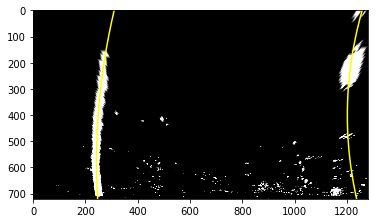

In [119]:
# Generate x and y values for plotting
left_line_test = Line()
right_line_test = Line()
img = cv2.imread('./test_images/test1.jpg')
binary_warped = preprocess(img)
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
left_line_test.fit_line_left(binary_warped)
right_line_test.fit_line_right(binary_warped)

plt.imshow(binary_warped, cmap='gray')
plt.plot(left_line_test.plot_line(binary_warped), ploty, color='yellow')
plt.plot(right_line_test.plot_line(binary_warped), ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

(720, 0)

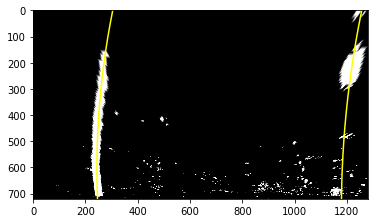

In [120]:
left_line_test.fit_line_left(binary_warped)
right_line_test.fit_line_right(binary_warped)

plt.imshow(binary_warped, cmap='gray')
plt.plot(left_line_test.plot_line(binary_warped), ploty, color='yellow')
plt.plot(right_line_test.plot_line(binary_warped), ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [138]:
def process(img):
    binary_warped = preprocess(img)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_line.fit_line_left(binary_warped)
    right_line.fit_line_right(binary_warped)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    undist = undistort(img)

    # Recast the x and y points into usable format for cv2.fillPoly()
    left_fitx = left_line.plot_line(binary_warped)
    right_fitx = right_line.plot_line(binary_warped)
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = warp(color_warp, True)
    # Combine the result with the original image
    return cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

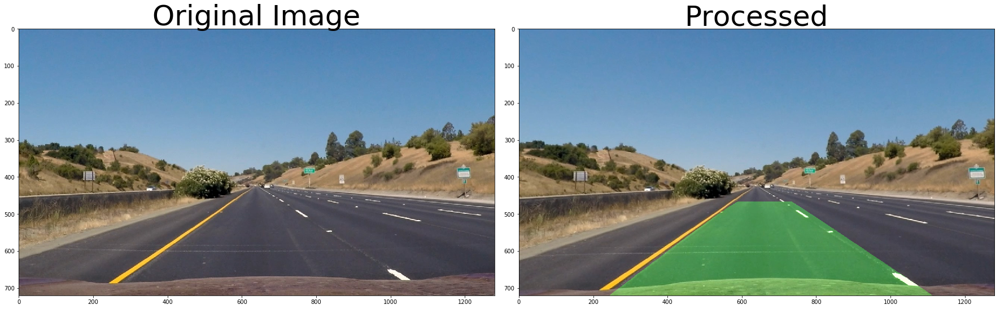

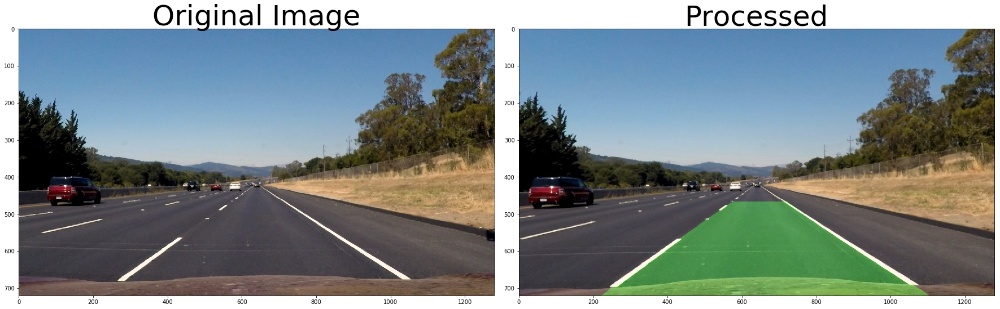

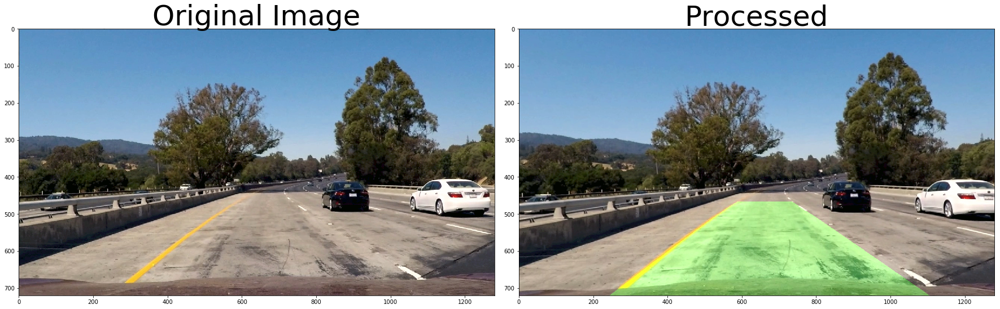

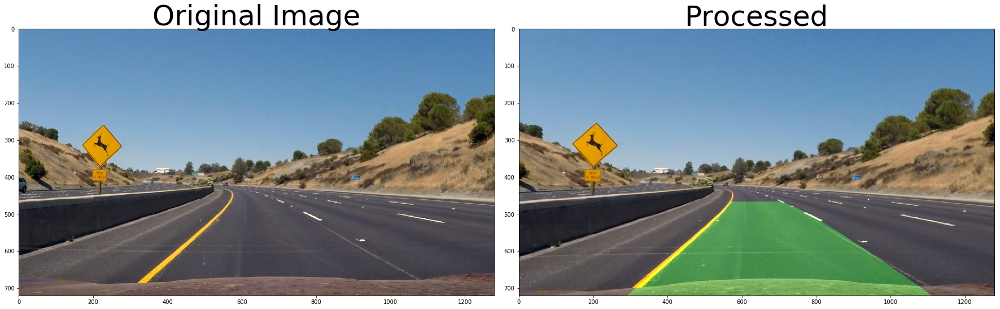

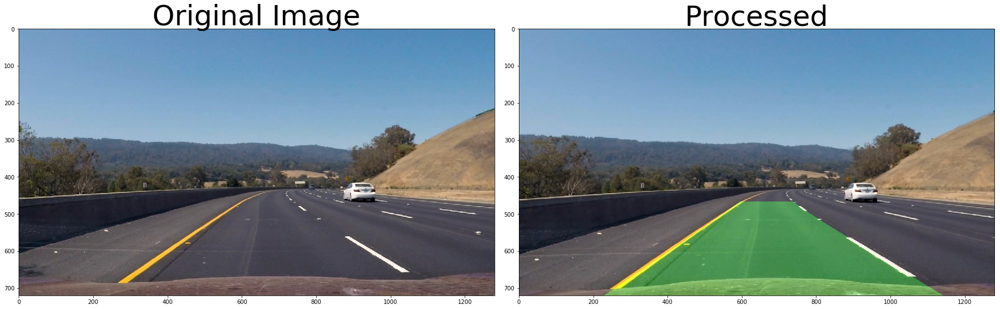

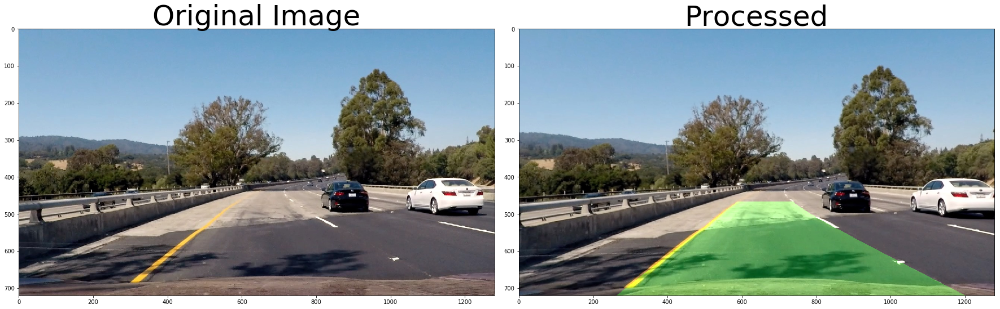

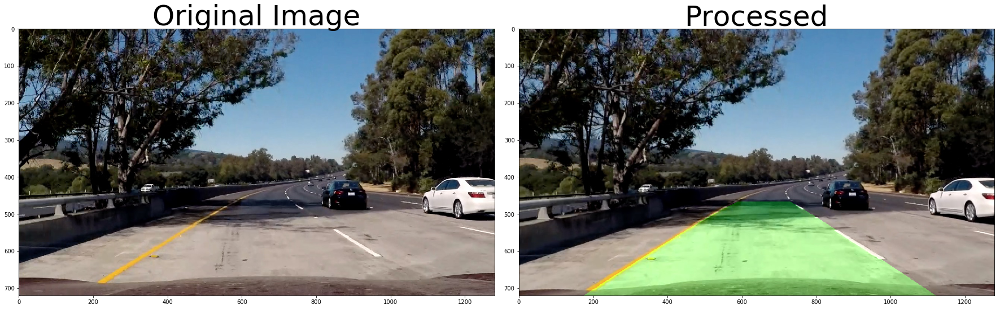

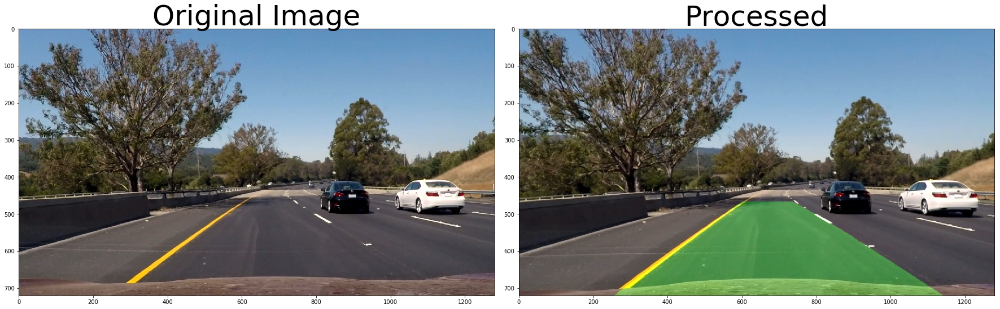

In [139]:
left_line = Line()
right_line = Line()
for fname in test_images:
    image = cv2.imread(fname)
    output = process(image)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(cv2.cvtColor(output, cv2.COLOR_RGB2BGR))
    ax2.set_title('Processed', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    output = fname.replace('test_images', 'output_images')
    mpimg.imsave(output, combined)

In [140]:
current_left_line, current_right_line = None, None
output_file = 'project_out.mp4'
clip1 = VideoFileClip("project_video.mp4")
output = clip1.fl_image(process) #NOTE: this function expects color images!!
%time output.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video project_out.mp4
[MoviePy] Writing video project_out.mp4


100%|█████████▉| 1260/1261 [56:03<00:02,  2.56s/it] 


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_out.mp4 

CPU times: user 55min 46s, sys: 1min 20s, total: 57min 6s
Wall time: 56min 5s
